## Práctica de Evaluación
### 👷🏻⛏ Minería de Datos y Modelización Predictiva 👷🏻⛏
#### Master Big Data & Data Science - Universidad Complutense de Madrid

**Santiago Torres Busquets**

<h2><u>Ejercicio 1</u></h2>

## 1) Estudio descriptivo de los datos

In [1]:
# tratamiento de datos
import pandas as pd
import numpy as np

# funciones predefinidas vistas en clase
import NuestrasFunciones as nf

# graficos
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

#librerias estadisticas
import scipy.stats as stats
import statsmodels.api as sm

# ignorar warnings
import warnings
warnings.filterwarnings('ignore')

Le damos una vista previa a los datos.

In [3]:
# dataset
data = pd.read_csv("C:\\Users\\Santiago\\Documents\\Santiago\\Maestria\\UCM\\Modulos\\Mineria de Datos y Modelizacion Predictiva\\Tarea Mineria de Datos\\FEV_data.csv")
data.head()

,seqnbr,subjid,age,fev,height,sex,smoke
0,1,301,9,1.708,57.0,2,2
1,2,451,8,1.724,67.5,2,2
2,3,501,7,1.720,54.5,2,2
3,4,642,9,1.558,53.0,1,2
4,5,901,9,1.895,57.0,1,2


In [4]:
# información del dataset
data.info()
data.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   seqnbr  654 non-null    int64  
 1   subjid  654 non-null    int64  
 2   age     654 non-null    int64  
 3   fev     654 non-null    float64
 4   height  654 non-null    float64
 5   sex     654 non-null    int64  
 6   smoke   654 non-null    int64  
dtypes: float64(2), int64(5)
memory usage: 35.9 KB


(654, 7)

Podemos observar que no tendremos que gestionar valores perdidos.

### Valores únicos de las variables

In [5]:
# Número de valores distintos por variable
data.nunique()

seqnbr    654
subjid    654
age        17
fev       575
height     56
sex         2
smoke       2
dtype: int64

Podemos considerar que las variables *sex* y *smoke* toman valores binarios por lo que deberían considerarse como categóricas.

### Conversión a factor de las variables mal indicadas como continuas

In [6]:
# Cambiamos el tipo de esas dos variables a factores
data = data.astype({'sex': 'category', 'smoke': 'category'})

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   seqnbr  654 non-null    int64   
 1   subjid  654 non-null    int64   
 2   age     654 non-null    int64   
 3   fev     654 non-null    float64 
 4   height  654 non-null    float64 
 5   sex     654 non-null    category
 6   smoke   654 non-null    category
dtypes: category(2), float64(2), int64(3)
memory usage: 27.2 KB


### Valores descriptivos por variable

In [8]:
data.describe()

,seqnbr,subjid,age,fev,height
count,654.00000,654.000000,654.000000,654.000000,654.000000
mean,327.50000,37169.571865,9.931193,2.636780,61.143578
std,188.93782,23690.860350,2.953935,0.867059,5.703513
min,1.00000,201.000000,3.000000,0.791000,46.000000
25%,164.25000,15811.000000,8.000000,1.981000,57.000000
50%,327.50000,36071.000000,10.000000,2.547500,61.500000
75%,490.75000,53638.500000,12.000000,3.118500,65.500000
max,654.00000,90001.000000,19.000000,5.793000,74.000000


**Descriptivos para las categóricas**

In [9]:
data.describe(exclude=np.number)

,sex,smoke
count,654,654
unique,2,2
top,1,2
freq,336,589


Podemos ver que las variables no parecen tener más defectos a corregir, solo eliminar las dos primeras columnas que corresponden a un index y a un subject_id, lo que no nos serviría para nuestro modelo.

### Reporte Descriptivo

Cont


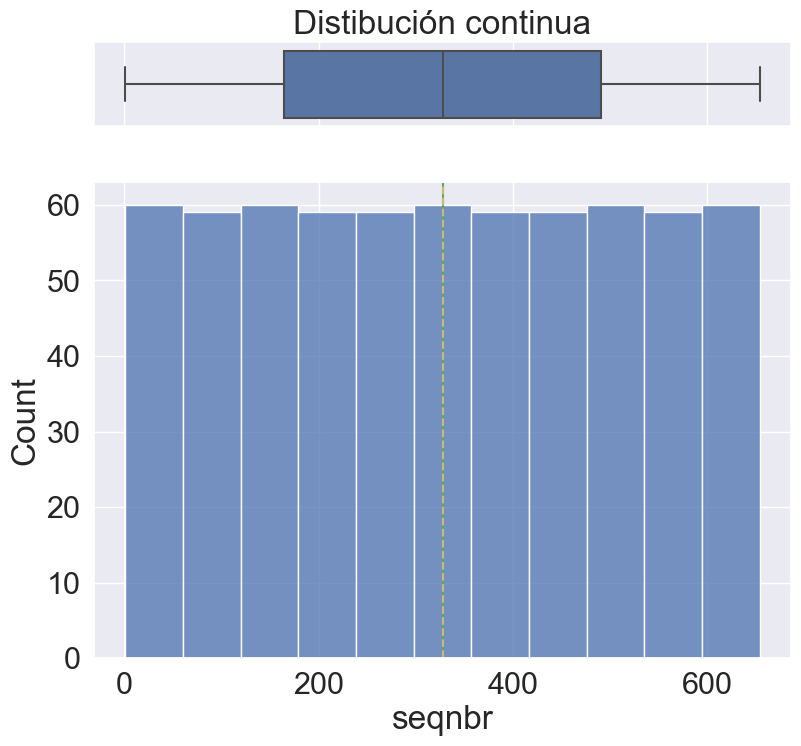

Cont


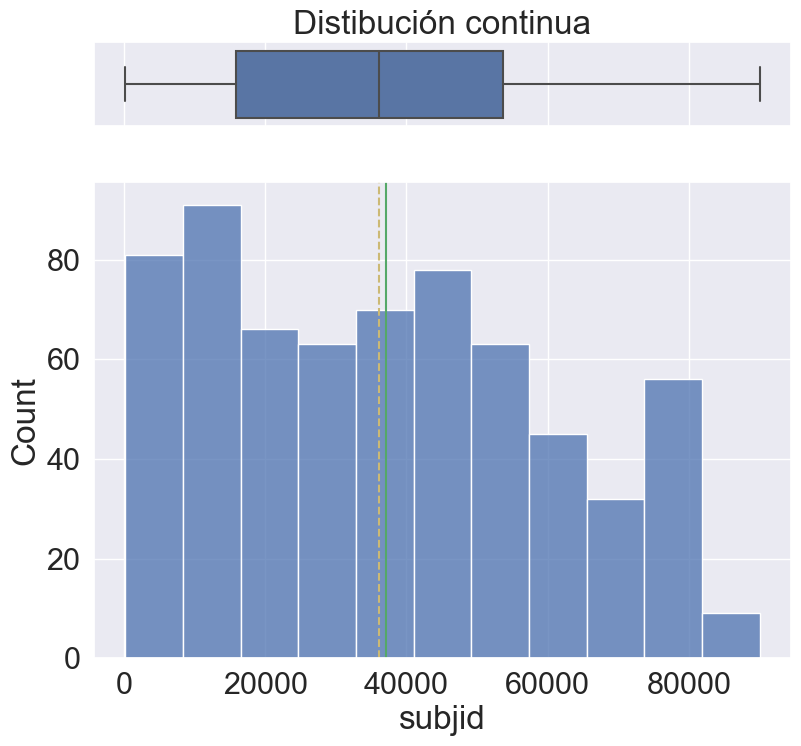

Cont


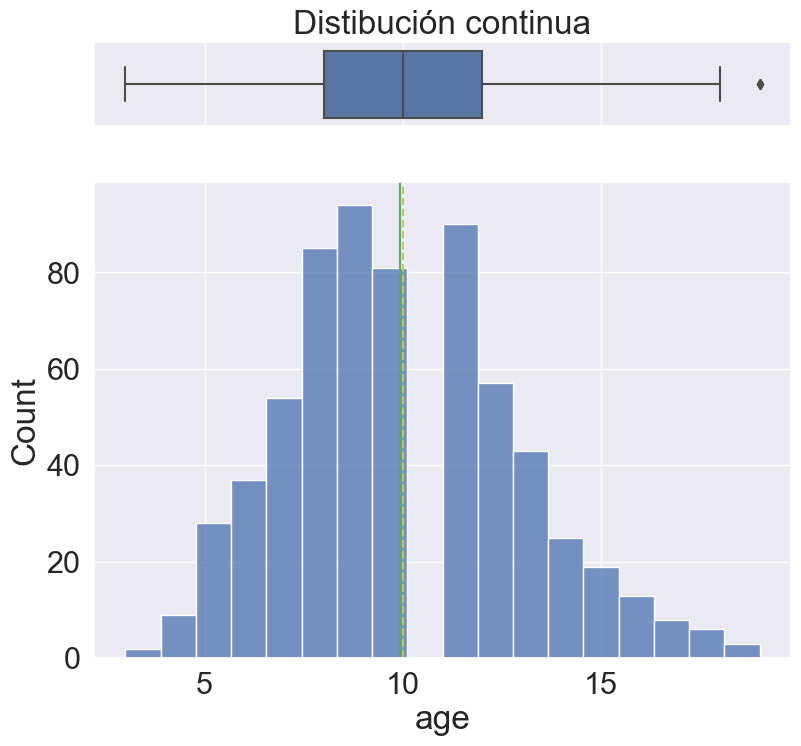

Cont


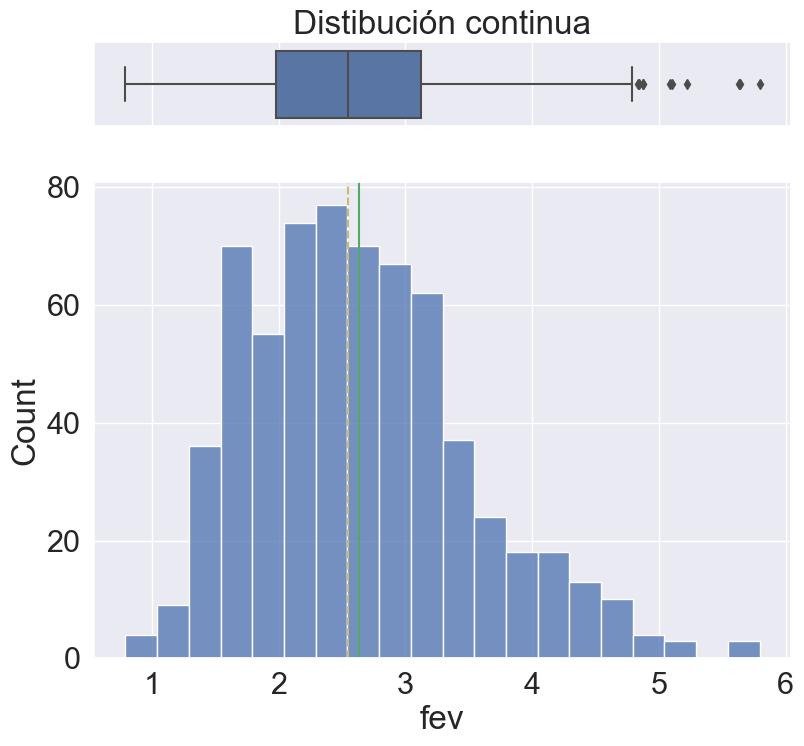

Cont


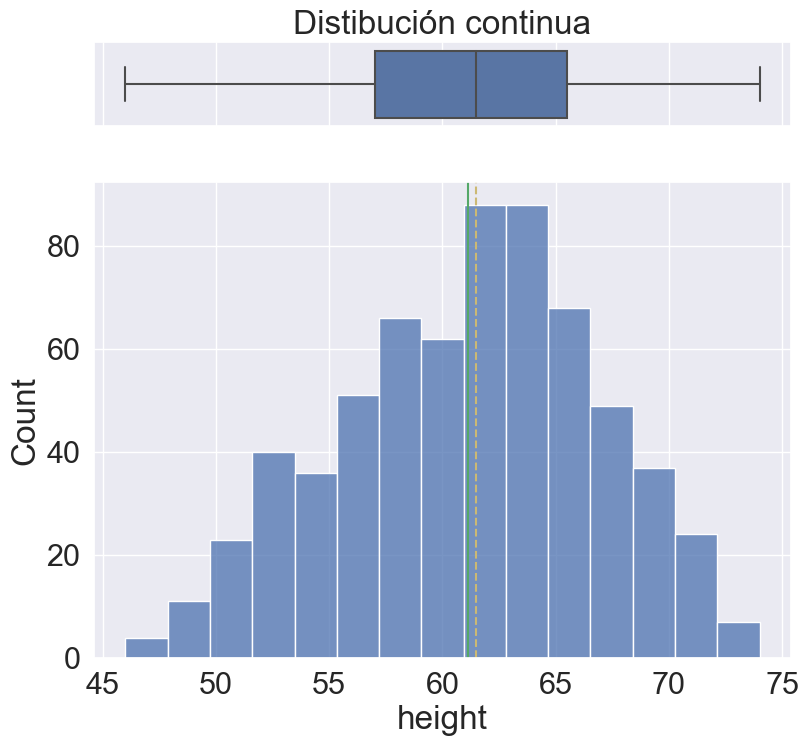

Cat
Cat


seqnbr    None
subjid    None
age       None
fev       None
height    None
sex       None
smoke     None
dtype: object

In [10]:
data.apply(nf.plot)

In [11]:
# Indico la variableObj, descarto variables índices
varObjCont = data.fev
imput = data.drop(['fev','seqnbr','subjid'],axis=1)

imput.head()

,age,height,sex,smoke
0,9,57.0,2,2
1,8,67.5,2,2
2,7,54.5,2,2
3,9,53.0,1,2
4,9,57.0,1,2


### Valores atípicos

In [12]:
imput.skew(axis=0, numeric_only=True)

age       0.413557
height   -0.213541
dtype: float64

In [13]:
imput.select_dtypes(include=np.number).copy().apply(lambda x: nf.gestiona_outliers(x))

age
height


,age,height
0,0.0,0.0
1,0.0,0.0
2,0.0,0.0


Podemos observar que las variables no se encuentran en el rango normal (-1,1) por lo que no se encuentran muy dispersas. AL mismo tiempo podemos observar que para las variables continuas no tenemos outliers que gestionar para winsorizar o imputar.

Podemos realizar también este análisis exploratorio usando **pandas_profiling**

In [14]:
import pandas_profiling
pandas_profiling.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Podemos ver en el heatmap que hay una alta correlación entre la variable objetivo y las variables *age* y *height* y además una correlación entre los predictores entre sí.

### Transformación de las variables continuas

In [15]:
# Aplicar a las variables continuas la mejor transfromación según correlacion frente a varObjCont
transf_cor = imput.select_dtypes(include=np.number).apply(lambda x: nf.mejorTransf(x,varObjCont, tipo='cor'))
# Pedir los nombres de las transromadas
transf_cor_names = imput.select_dtypes(include=np.number).apply(lambda x: nf.mejorTransf(x,varObjCont,tipo='cor', name=True))
# Asignar nombres a las columnas de salida del proceso
transf_cor.columns = transf_cor_names.values
transf_cor

,age_ident,height_sqr
0,2.032843,3.725719
1,1.694053,14.232450
2,1.355262,2.224722
3,2.032843,1.508852
4,2.032843,3.725719
...,...,...
649,4.404378,13.578190
650,4.065587,14.902104
651,5.081959,6.034915
652,4.404378,8.898293


In [16]:
# Aplicar a las variables continuas la mejor transfromación según cramer frente a varObjCont
transf_cramer = imput.select_dtypes(include=np.number).apply(lambda x: nf.mejorTransf(x,varObjCont, tipo='cramer'))
transf_cramer_names = imput.select_dtypes(include=np.number).apply(lambda x: nf.mejorTransf(x,varObjCont,tipo='cramer', name=True))
transf_cramer.columns = transf_cramer_names.values
transf_cramer

,age_ident,height_sqr
0,2.032843,3.725719
1,1.694053,14.232450
2,1.355262,2.224722
3,2.032843,1.508852
4,2.032843,3.725719
...,...,...
649,4.404378,13.578190
650,4.065587,14.902104
651,5.081959,6.034915
652,4.404378,8.898293


Podemos observar que la variable *age* no mejora en sus transformaciones y sí lo hace un poco el cuadrado de la variable *height*.

In [17]:
# Input con transfromadas según correlación
imput_transf_cor = imput.join(transf_cor)

# Input con transfromadas según cramer
imput_transf_cramer = imput.join(transf_cramer)

Descartamos la columna *age_ident* por tratarse de la misma variable original.

In [18]:
imput2 = imput_transf_cramer.drop(['age_ident'],axis=1)
imput2.head()

,age,height,sex,smoke,height_sqr
0,9,57.0,2,2,3.725719
1,8,67.5,2,2,14.232450
2,7,54.5,2,2,2.224722
3,9,53.0,1,2,1.508852
4,9,57.0,1,2,3.725719


In [19]:
imput2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   age         654 non-null    int64   
 1   height      654 non-null    float64 
 2   sex         654 non-null    category
 3   smoke       654 non-null    category
 4   height_sqr  654 non-null    float64 
dtypes: category(2), float64(2), int64(1)
memory usage: 17.0 KB


In [20]:
# Matriz de correlaciones incluyendo transformaciones
corr = imput2.join(varObjCont).corr()
corr.style.background_gradient(cmap='coolwarm').format(precision=3)

,age,height,height_sqr,fev
age,1.000,0.792,0.761,0.756
height,0.792,1.000,0.973,0.868
height_sqr,0.761,0.973,1.000,0.878
fev,0.756,0.868,0.878,1.000


Utilizamos la tabla ANOVA para conocer la significancia de las variables categóricas sobre la variable objetivo.

In [24]:
# ANOVA sex
from statsmodels.formula.api import ols
model = ols('fev ~ C(sex)', data=data).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(sex),21.323984,1.0,29.606816,7.495754e-08
Residual,469.595852,652.0,NaN,NaN


In [25]:
# ANOVA smoke
model = ols('fev ~ C(smoke)', data=data).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(smoke),29.569683,1.0,41.789155,1.992846e-10
Residual,461.350154,652.0,NaN,NaN


### Partición training-test

In [26]:
# Función necesaria
from sklearn.model_selection import train_test_split

# Creamos 4 objetos: predictores para tr y tst y variable objetivo para tr y tst. 
X_train, X_test, y_train, y_test = train_test_split(imput2, varObjCont, test_size=0.2, random_state=123)

# Comprobamos dimensiones
print('Training dataset shape:', X_train.shape, y_train.shape)
print('Testing dataset shape:', X_test.shape, y_test.shape)

Training dataset shape: (523, 5) (523,)
Testing dataset shape: (131, 5) (131,)


In [27]:
# Genero el training con la objetivo dentro 
data_train = X_train.join(y_train)
data_train

,age,height,sex,smoke,height_sqr,fev
567,13,70.5,1,2,18.481282,4.232
375,11,64.5,1,2,10.537800,2.463
619,16,66.5,2,2,12.939324,3.387
185,7,53.5,1,2,1.732081,1.790
242,8,59.0,2,2,5.203607,2.335
...,...,...,...,...,...,...
98,7,55.0,1,2,2.494134,1.682
322,12,63.0,2,2,8.898293,2.841
382,10,65.5,2,2,11.707774,3.183
365,13,61.0,2,1,6.927798,3.208


In [28]:
# Importamos la api para fórmulas (en concreto ols para regresión) 
form = 'fev ~ age + height + smoke + sex'
# Ajusto regresión según fórmula completa
modeloC = ols(form,data=data_train).fit()
modeloC.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.777
Model:                            OLS   Adj. R-squared:                  0.775
Method:                 Least Squares   F-statistic:                     450.9
Date:                Fri, 24 Feb 2023   Prob (F-statistic):          3.73e-167
Time:                        12:32:59   Log-Likelihood:                -289.30
No. Observations:                 523   AIC:                             588.6
Df Residuals:                     518   BIC:                             609.9
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -4.3667      0.276    -15.817      0.000      -4.909      -3.824
smoke[T.2]     0.1264      0.068      1.871      0.062      -0.006       0.259
sex[T.2]      -0.1754      0.038     -4.593      0.000      -0.250      -0.100
age            0.0718      0.011      6.704      0.000       0.051       0.093
height         0.1025      0.005     18.741      0.000       0.092       0.113
==============================================================================
Omnibus:                       16.701   Durbin-Watson:                   1.960
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               28.822
Skew:                           0.205   Prob(JB):                     5.51e-07
Kurtosis:                       4.074   Cond. No.                         934.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [29]:
from relativeImp import relativeImp

# Nombres de las variables continuas
names=X_train.select_dtypes(include=np.number).columns.tolist()

# Calcular importancia relativa de las variable continuas en modelo (solo con variables continuas!)
df_results = relativeImp(data_train, outcomeName = 'fev', driverNames = names)

df_results.sort_values(by='normRelaImpt', ascending=False)

,driver,rawRelaImpt,normRelaImpt
2,height_sqr,0.296723,37.743314
1,height,0.274125,34.868811
0,age,0.215312,27.387875


In [30]:
import patsy

# Generamos las matrices de diseño según la fórmula de modelo completo
y, X = patsy.dmatrices(form, data_train, return_type='dataframe')

In [31]:
# Ahora podemos aplicar la función "oficial" de statmodels OLS (con formato y,X)
model=sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.777
Model:                            OLS   Adj. R-squared:                  0.775
Method:                 Least Squares   F-statistic:                     450.9
Date:                Fri, 24 Feb 2023   Prob (F-statistic):          3.73e-167
Time:                        12:33:06   Log-Likelihood:                -289.30
No. Observations:                 523   AIC:                             588.6
Df Residuals:                     518   BIC:                             609.9
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -4.3667      0.276    -15.817      0.000      -4.909      -3.824
smoke[T.2]     0.1264      0.068      1.871      0.062      -0.006       0.259
sex[T.2]      -0.1754      0.038     -4.593      0.000      -0.250      -0.100
age            0.0718      0.011      6.704      0.000       0.051       0.093
height         0.1025      0.005     18.741      0.000       0.092       0.113
==============================================================================
Omnibus:                       16.701   Durbin-Watson:                   1.960
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               28.822
Skew:                           0.205   Prob(JB):                     5.51e-07
Kurtosis:                       4.074   Cond. No.                         934.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [32]:
# Nombres de predictores (en modo dummy) donde quitamos la constante
names=X.columns.tolist()[1:]

# Calculamos importancia relativa
df_results = relativeImp(X.join(y), outcomeName = 'fev', driverNames = names)

# Ordenamos valores 
df_results.sort_values(by='normRelaImpt', ascending=False)

,driver,rawRelaImpt,normRelaImpt
3,height,0.435986,56.119236
2,age,0.290159,37.348686
1,sex[T.2],0.031847,4.099257
0,smoke[T.2],0.018900,2.432821


In [33]:
# Gráfico de importancia relativa en base al R2
px.bar(df_results,x='normRelaImpt',y='driver',title='Importancia relativa por aportación al R2').update_yaxes(categoryorder="total ascending").show()

In [34]:
data_train

,age,height,sex,smoke,height_sqr,fev
567,13,70.5,1,2,18.481282,4.232
375,11,64.5,1,2,10.537800,2.463
619,16,66.5,2,2,12.939324,3.387
185,7,53.5,1,2,1.732081,1.790
242,8,59.0,2,2,5.203607,2.335
...,...,...,...,...,...,...
98,7,55.0,1,2,2.494134,1.682
322,12,63.0,2,2,8.898293,2.841
382,10,65.5,2,2,11.707774,3.183
365,13,61.0,2,1,6.927798,3.208


In [35]:
# Proceso backward de eliminación de efectos según p-valor
form2=nf.ols_formula(data_train,'fev')

# Ajusto regresión
modeloC2 = ols(form2,data=data_train).fit()
modeloC2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.793
Model:                            OLS   Adj. R-squared:                  0.791
Method:                 Least Squares   F-statistic:                     396.7
Date:                Fri, 24 Feb 2023   Prob (F-statistic):          2.42e-174
Time:                        12:33:14   Log-Likelihood:                -269.38
No. Observations:                 523   AIC:                             550.8
Df Residuals:                     517   BIC:                             576.3
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.0061      0.732     -0.008      0.993      -1.443       1.431
sex[T.2]      -0.1125      0.038     -2.954      0.003      -0.187      -0.038
smoke[T.2]     0.1712      0.065      2.616      0.009       0.043       0.300
age            0.0744      0.010      7.205      0.000       0.054       0.095
height         0.0167      0.014      1.163      0.245      -0.012       0.045
height_sqr     0.0970      0.015      6.398      0.000       0.067       0.127
==============================================================================
Omnibus:                       18.903   Durbin-Watson:                   1.908
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               45.178
Skew:                          -0.019   Prob(JB):                     1.55e-10
Kurtosis:                       4.439   Cond. No.                     2.58e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.58e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [36]:
from sklearn.metrics import mean_squared_error, r2_score

# Predicciones para test modelo completo
fev_y_pred = modeloC.predict(X_test)
fev_y_pred,y_test

(269    1.068590
 366    3.140639
 43     2.001580
 171    1.746380
 11     1.869453
          ...   
 464    2.350229
 421    3.537262
 75     2.002641
 547    2.657742
 458    3.612360
 Length: 131, dtype: float64,
 269    1.539
 366    2.592
 43     1.931
 171    2.158
 11     1.735
        ...  
 464    2.358
 421    4.756
 75     1.789
 547    2.688
 458    3.089
 Name: fev, Length: 131, dtype: float64)

In [37]:
# Cálculo de performance
print("Mean squared error: %.2f" % np.sqrt(mean_squared_error(y_test, fev_y_pred)))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, fev_y_pred))

Mean squared error: 0.37
Coefficient of determination: 0.76


In [38]:
from sklearn.metrics import mean_squared_error, r2_score

# Predicciones para test modelo C2
fev_y_pred = modeloC2.predict(X_test)

# Cálculo de performance
print("Mean squared error: %.2f" % np.sqrt(mean_squared_error(y_test, fev_y_pred)))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, fev_y_pred))

Mean squared error: 0.34
Coefficient of determination: 0.79


## Validación cruzada repetida

In [39]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import LinearRegression

model = LinearRegression()

# Establecemos esquema de validación fijando random_state (reproducibilidad)
cv = RepeatedKFold(n_splits=5, n_repeats=20, random_state=123)

# Obtenemos los resultados de R2 para cada partición tr-tst
scores = cross_val_score(model, X, y, cv=cv)

# Sesgo y varianza
print('Coeficioente de detrminación R2: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

Coeficioente de detrminación R2: 0.767 (0.032)


<AxesSubplot:>

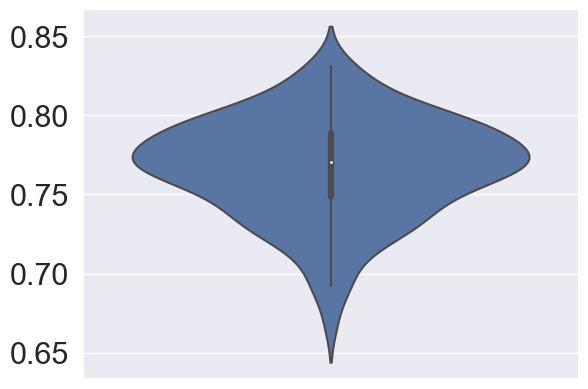

In [40]:
sns.violinplot(y=scores)

Coeficioente de detrminación R2 Modelo Final Backward: 0.782 (0.036)


<AxesSubplot:>

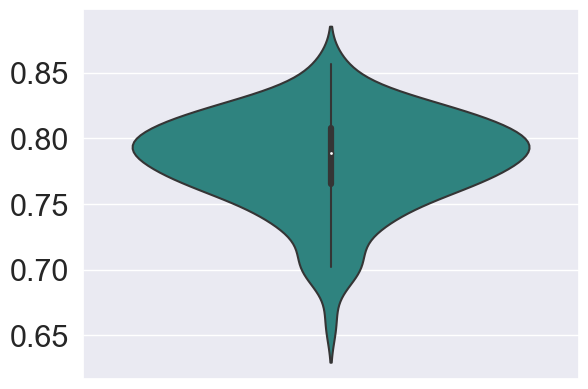

In [41]:
# Generamos las matrices de diseño según la fórmula de modelo completo
y2, X2 = patsy.dmatrices(form2, data_train, return_type='dataframe')

# Obtenemos los resultados de R2 para cada partición tr-tst
scores = cross_val_score(model, X2, y2, cv=cv)

# Sesgo y varianza
print('Coeficioente de detrminación R2 Modelo Final Backward: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

sns.violinplot(y=scores,palette='viridis')


Modelo de Regresion Lineal con interacciones

In [42]:
form3 = 'fev ~ age + smoke + height + height_sqr + age*smoke'

# Ajusto regresión sin prop_missings
modeloC3 = ols(form3,data=data_train).fit()
modeloC3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.788
Method:                 Least Squares   F-statistic:                     389.7
Date:                Fri, 24 Feb 2023   Prob (F-statistic):          9.68e-173
Time:                        12:33:36   Log-Likelihood:                -273.11
No. Observations:                 523   AIC:                             558.2
Df Residuals:                     517   BIC:                             583.8
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          0.7763      0.855      0.908      0.364      -0.903       2.455
smoke[T.2]        -0.1892      0.348     -0.544      0.587      -0.873       0.494
age                0.0474      0.024      1.994      0.047       0.001       0.094
age:smoke[T.2]     0.0292      0.026      1.125      0.261      -0.022       0.080
height             0.0070      0.015      0.480      0.631      -0.022       0.036
height_sqr         0.1097      0.015      7.415      0.000       0.081       0.139
==============================================================================
Omnibus:                       22.280   Durbin-Watson:                   1.894
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               59.152
Skew:                          -0.035   Prob(JB):                     1.43e-13
Kurtosis:                       4.646   Cond. No.                     3.10e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.1e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [45]:
form4 = 'fev ~ age + height + sex + smoke'
form5 = 'fev ~ height + age + sex'
form6 = 'fev ~ age + sex + smoke'
form7 = 'fev ~ age + height + smoke'


# Creamos lista de fórmulas   
list_form = [form,form2,form3,form4,form5,form6,form7]
list_form

# Aplicamos a toda la lista la función creada (devuelve un dataframe pero está transpuesto)
list_res = pd.DataFrame(map(lambda x: nf.cross_val_lin(x,data_train, seed=2022),list_form))
list_res

Modelo: fev ~ age + height + smoke + sex
Coeficiente de determinación R2: 0.768 (0.032)
Modelo: fev ~ age + height + sex + smoke + height_sqr
Coeficiente de determinación R2: 0.783 (0.037)
Modelo: fev ~ age + smoke + height + height_sqr + age*smoke
Coeficiente de determinación R2: 0.780 (0.038)
Modelo: fev ~ age + height + sex + smoke
Coeficiente de determinación R2: 0.768 (0.032)
Modelo: fev ~ height + age + sex
Coeficiente de determinación R2: 0.768 (0.032)
Modelo: fev ~ age + sex + smoke
Coeficiente de determinación R2: 0.613 (0.051)
Modelo: fev ~ age + height + smoke
Coeficiente de determinación R2: 0.759 (0.032)


,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.784059,0.740751,0.782888,0.788769,0.772190,0.793373,0.716871,0.793419,0.732885,0.784077,...,0.772252,0.711320,0.798620,0.750836,0.789870,0.723782,0.802737,0.814241,0.766931,0.757189
1,0.808843,0.733995,0.808087,0.807745,0.785388,0.824826,0.720350,0.816914,0.746883,0.792213,...,0.775190,0.706596,0.817754,0.774401,0.823420,0.746778,0.822501,0.822068,0.786624,0.758994
2,0.806565,0.724650,0.808589,0.802694,0.781910,0.822977,0.714891,0.815635,0.737559,0.780012,...,0.770531,0.702596,0.811148,0.767495,0.823969,0.741595,0.822113,0.815757,0.781055,0.760722
3,0.784059,0.740751,0.782888,0.788769,0.772190,0.793373,0.716871,0.793419,0.732885,0.784077,...,0.772252,0.711320,0.798620,0.750836,0.789870,0.723782,0.802737,0.814241,0.766931,0.757189
4,0.782931,0.739701,0.781996,0.791074,0.767935,0.789937,0.719410,0.790813,0.739107,0.786980,...,0.768890,0.714061,0.797383,0.755229,0.788244,0.721192,0.799765,0.816579,0.766364,0.766954
5,0.658189,0.621038,0.554775,0.659045,0.592176,0.651643,0.536229,0.633630,0.650888,0.563712,...,0.543563,0.615573,0.727154,0.627209,0.557808,0.582152,0.626014,0.630588,0.651834,0.622372
6,0.775792,0.733180,0.774751,0.779066,0.759678,0.787365,0.718691,0.782749,0.716237,0.775359,...,0.765311,0.702447,0.780244,0.742939,0.783452,0.716625,0.792779,0.801101,0.752046,0.761479


In [46]:
# Trasnponer dataframe y pasar de wide a long (creando un factor variable con el nombre de cada fórmula de la lista[0,1,2,3])
results = list_res.T.melt()
results.columns = ['Modelo','R2']
results.head()

,Modelo,R2
0,0,0.784059
1,0,0.740751
2,0,0.782888
3,0,0.788769
4,0,0.772190


<AxesSubplot:xlabel='Modelo', ylabel='R2'>

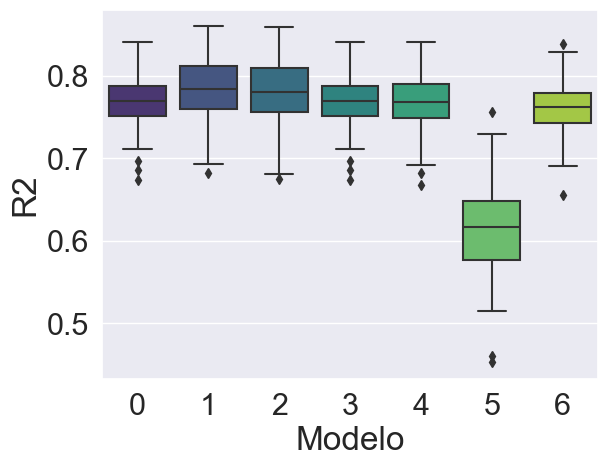

In [47]:
# Boxplot paralelo para comparar
sns.boxplot(x='Modelo',y='R2',data=results,palette='viridis')

### Ajuste del modelo final. Interpretación de parámetro

In [48]:
# Ajusto regresión
modelo_final = ols(form2,data=data_train).fit()
modelo_final.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.793
Model:                            OLS   Adj. R-squared:                  0.791
Method:                 Least Squares   F-statistic:                     396.7
Date:                Fri, 24 Feb 2023   Prob (F-statistic):          2.42e-174
Time:                        12:34:28   Log-Likelihood:                -269.38
No. Observations:                 523   AIC:                             550.8
Df Residuals:                     517   BIC:                             576.3
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.0061      0.732     -0.008      0.993      -1.443       1.431
sex[T.2]      -0.1125      0.038     -2.954      0.003      -0.187      -0.038
smoke[T.2]     0.1712      0.065      2.616      0.009       0.043       0.300
age            0.0744      0.010      7.205      0.000       0.054       0.095
height         0.0167      0.014      1.163      0.245      -0.012       0.045
height_sqr     0.0970      0.015      6.398      0.000       0.067       0.127
==============================================================================
Omnibus:                       18.903   Durbin-Watson:                   1.908
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               45.178
Skew:                          -0.019   Prob(JB):                     1.55e-10
Kurtosis:                       4.439   Cond. No.                     2.58e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.58e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<h2><u>Ejercicio 2</u></h2>

### Lectura y decomposición de la serie

In [49]:
# dataset defunciones
df = pd.read_excel("C:\\Users\\Santiago\\Documents\\Santiago\\Maestria\\UCM\\Modulos\\Mineria de Datos y Modelizacion Predictiva\\Tarea Mineria de Datos\\defunciones.xlsx")
df

,,Todas las causas,Tumores,Causas externas
0,1980M01,28681,4883,1277
1,1980M02,23906,4493,1122
2,1980M03,25275,4957,1244
3,1980M04,22500,4523,1214
4,1980M05,22781,4893,1228
...,...,...,...,...
463,2018M08,33177,9370,1472
464,2018M09,30293,9079,1306
465,2018M10,32879,9629,1275
466,2018M11,34338,9315,1234


In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 468 entries, 0 to 467
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0                     468 non-null    object
 1   Todas las causas  468 non-null    int64 
 2   Tumores           468 non-null    int64 
 3   Causas externas   468 non-null    int64 
dtypes: int64(3), object(1)
memory usage: 14.8+ KB


In [51]:
# Convierto en serie temporal
df['Fecha'] = df.iloc[:,0].apply(lambda x: x.replace('M','-'))
df.set_index(['Fecha'],inplace=True)
df.index=pd.to_datetime(df.index)
df = df.drop([' '],axis=1)
df.head()

,Todas las causas,Tumores,Causas externas
Fecha,,,
1980-01-01,28681,4883,1277
1980-02-01,23906,4493,1122
1980-03-01,25275,4957,1244
1980-04-01,22500,4523,1214
1980-05-01,22781,4893,1228


Elijo realizar el análisis en base a la columna de todas las causas de defunciones.

## Estudio Descriptivo

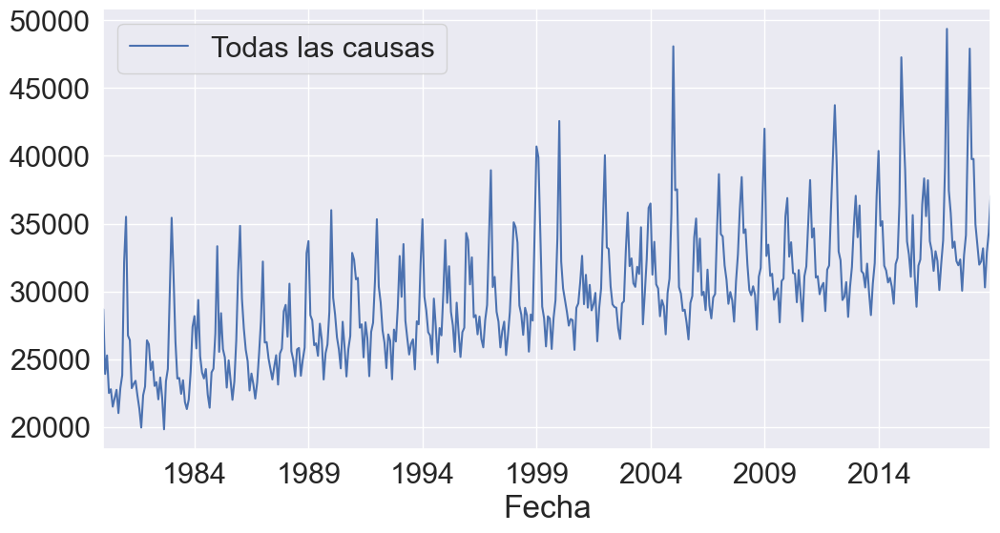

In [52]:
# Grafico con serie
plt.rcParams["figure.figsize"] = (12,6)
df['Todas las causas'].plot()
plt.legend()
plt.show()

test de Dickey Fuller para la estacionariedad de la serie al natural.

In [53]:
nf.test_stationarity(df['Todas las causas'])

Results of Dickey-Fuller Test:
Test Statistic                  -0.942604
p-value                          0.773619
#Lags Used                      14.000000
Number of Observations Used    453.000000
Critical Value (1%)             -3.444868
Critical Value (5%)             -2.867941
Critical Value (10%)            -2.570180
dtype: float64


Para la serie "todas las causas" no podemos rechazar la hipótesis nula de no estacionariedad ya que $p > 0.05$

## Decomposición de la serie

### Decomposición aditiva

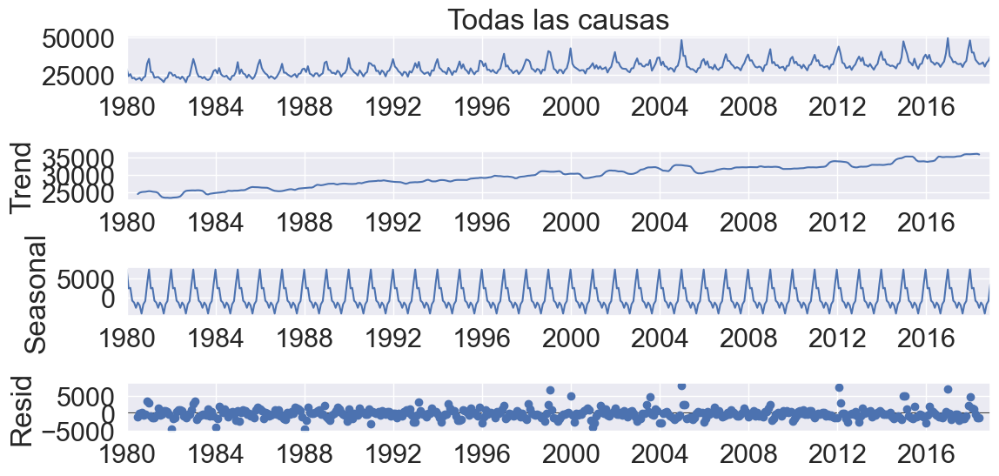

In [54]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Aplicar descomposición aditiva
def_desc_Ad = seasonal_decompose(df['Todas las causas'], model='additive',period=12)
def_desc_Ad.plot()
plt.show()

Evaluamos estacionariedad de los residuos de la descomposición aditiva.

In [55]:
nf.test_stationarity(def_desc_Ad.resid.dropna())

Results of Dickey-Fuller Test:
Test Statistic                -9.833132e+00
p-value                        4.975783e-17
#Lags Used                     1.800000e+01
Number of Observations Used    4.370000e+02
Critical Value (1%)           -3.445403e+00
Critical Value (5%)           -2.868177e+00
Critical Value (10%)          -2.570305e+00
dtype: float64


### Decomposición multiplicativa

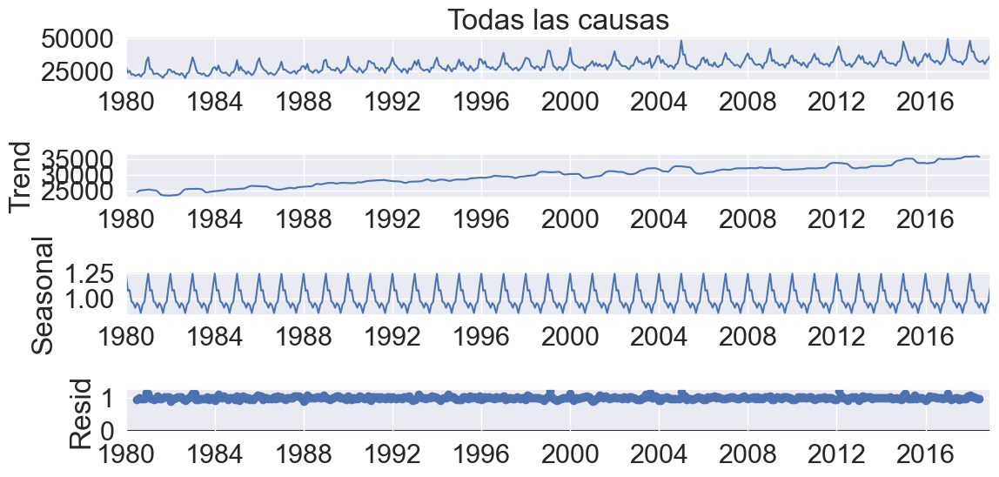

In [56]:
# Aplicar descomposición multiplicativa
def_desc_Mul = seasonal_decompose(df['Todas las causas'], model='multiplicative',period=12)
def_desc_Mul.plot()
plt.show()

Evaluamos estacionariedad de los residuos de la descomposición Multiplicativa.

In [57]:
nf.test_stationarity(def_desc_Mul.resid.dropna())

Results of Dickey-Fuller Test:
Test Statistic                -9.977362e+00
p-value                        2.159804e-17
#Lags Used                     1.700000e+01
Number of Observations Used    4.380000e+02
Critical Value (1%)           -3.445368e+00
Critical Value (5%)           -2.868161e+00
Critical Value (10%)          -2.570297e+00
dtype: float64


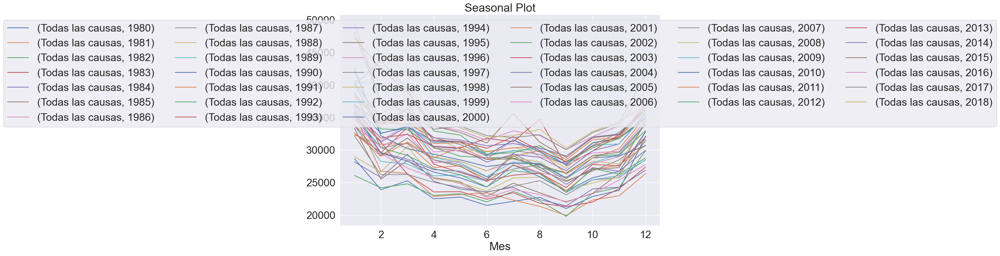

In [59]:
def_todas = df['Todas las causas']
nf.seasonal_plot(df, column="Todas las causas")
plt.rcParams["figure.figsize"] = (12,10)
plt.title('Seasonal Plot')
plt.xlabel('Mes')
plt.legend(ncol=6,loc="upper center")
plt.show()


## Estabilización de la varianza. Transformación Logaritmica

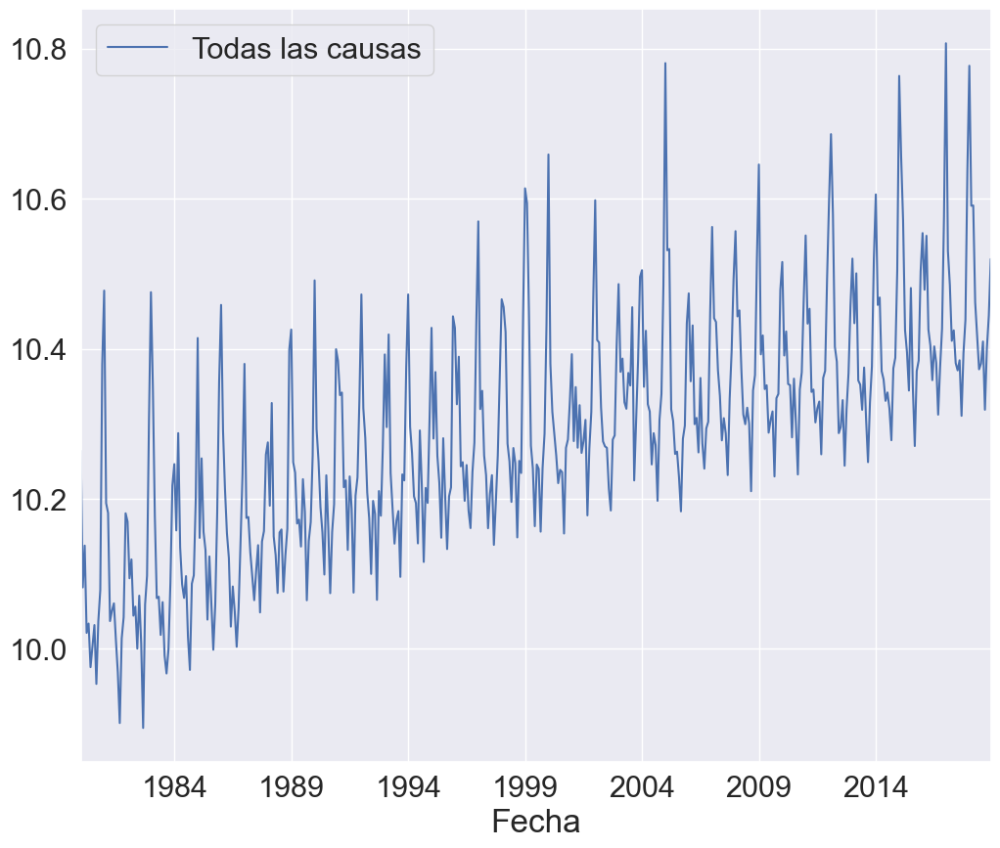

In [60]:
defLog = np.log(def_todas)
defLog.plot()
plt.rcParams["figure.figsize"] = (9,6)
plt.legend()
plt.show()

**Diferenciación regular**

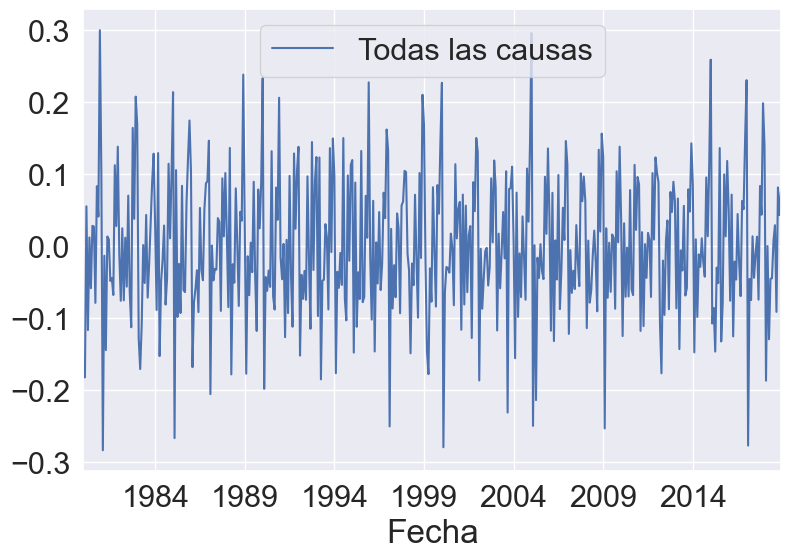

In [61]:
defLog_diff_1 = defLog.diff(periods=1)
defLog_diff_1.plot()
plt.rcParams["figure.figsize"] = (9,7)
plt.legend()
plt.show()

**Diferenciación estacional**

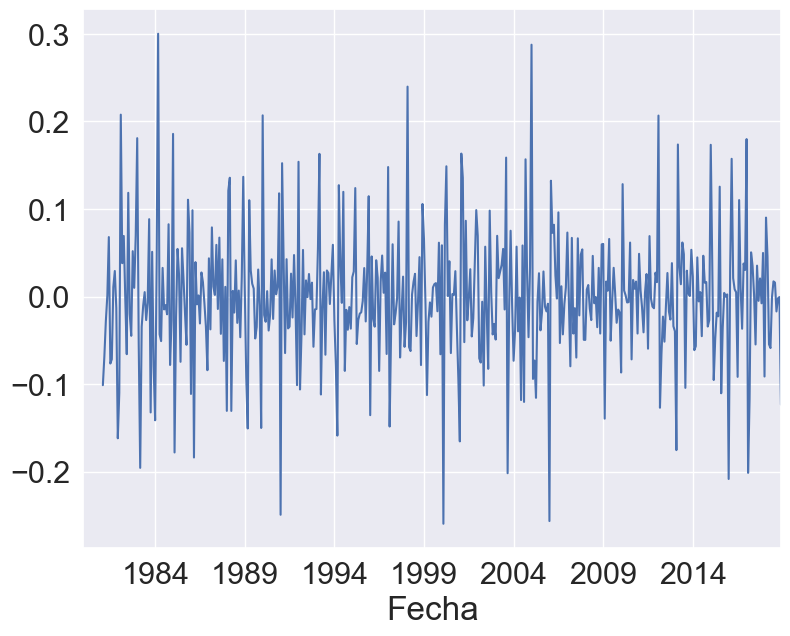

In [62]:
defLog_diff_1_12 = defLog_diff_1.diff(periods=12)
defLog_diff_1_12.plot()
plt.rcParams["figure.figsize"] = (9,7)
plt.show()

**Comprobación de estacionariedad**

In [63]:
nf.test_stationarity(defLog_diff_1_12.dropna(inplace=False))

Results of Dickey-Fuller Test:
Test Statistic                -1.029023e+01
p-value                        3.586141e-18
#Lags Used                     1.700000e+01
Number of Observations Used    4.370000e+02
Critical Value (1%)           -3.445403e+00
Critical Value (5%)           -2.868177e+00
Critical Value (10%)          -2.570305e+00
dtype: float64


**Autocorrelaciones**

In [64]:
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

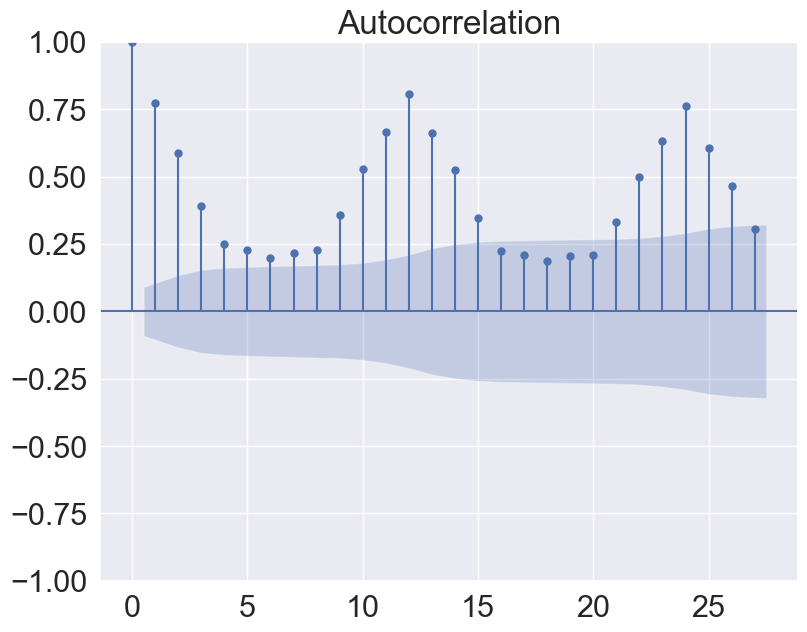

In [65]:
plot_acf(def_todas.dropna(inplace=False))
plt.show()

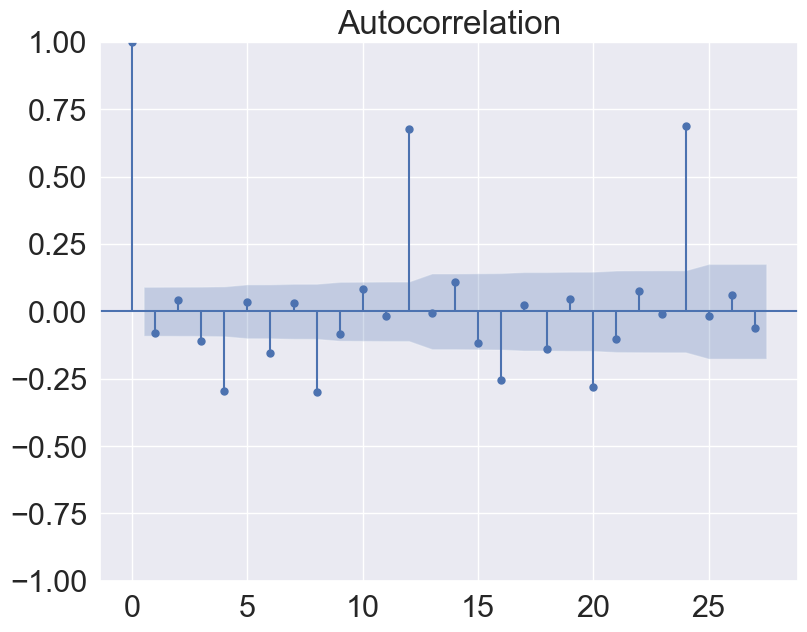

In [66]:
plot_acf(defLog_diff_1.dropna(inplace=False))
plt.show()

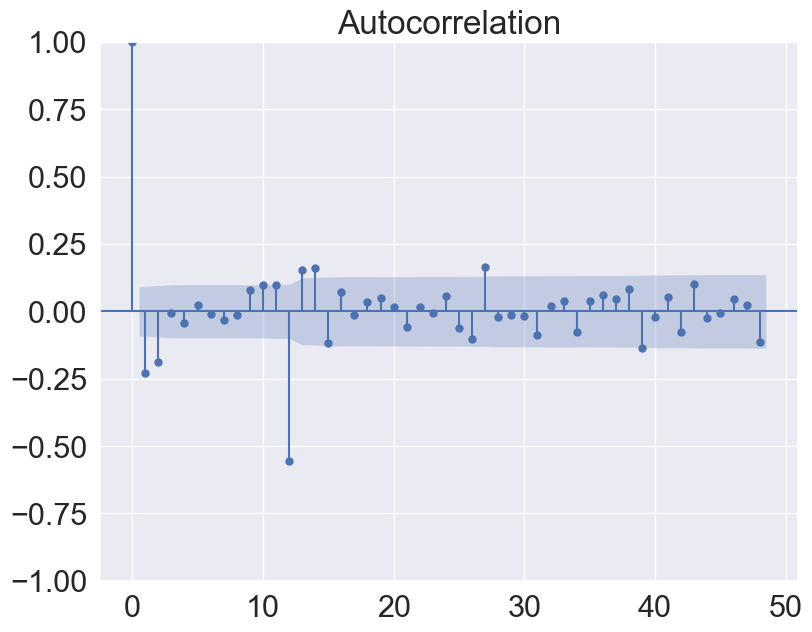

In [67]:
plot_acf(defLog_diff_1_12.dropna(inplace=False), lags=48)
plt.show()

In [69]:
# Test Ljung-box
sm.stats.acorr_ljungbox(defLog_diff_1_12.dropna(inplace=False), lags=[10], return_df=True)

,lb_stat,lb_pvalue
10,49.055084,3.979652e-07


In [70]:
sm.stats.acorr_ljungbox(def_todas, lags=[10], return_df=True)

,lb_stat,lb_pvalue
10,830.660066,5.272461e-172


## Particion training y test

In [71]:
import statsmodels.tsa.holtwinters as ets
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error

# Generamos la serie logaritmica
defLog = df.copy()
defLog['Todas las causas'] = np.log(defLog['Todas las causas'])
defLog


def_tr = defLog[:'2016-12-01']
def_tst = defLog['2017-01-01':]
def_tst.iloc[:,1]

Fecha
2017-01-01    10558
2017-02-01     8954
2017-03-01     9581
2017-04-01     9032
2017-05-01     9385
2017-06-01     8922
2017-07-01     9373
2017-08-01     9271
2017-09-01     9078
2017-10-01     9512
2017-11-01     9594
2017-12-01    10006
2018-01-01    10260
2018-02-01     8947
2018-03-01     9638
2018-04-01     9005
2018-05-01     9350
2018-06-01     9159
2018-07-01     9219
2018-08-01     9370
2018-09-01     9079
2018-10-01     9629
2018-11-01     9315
2018-12-01     9743
Name: Tumores, dtype: int64

## Modelos de Suavizado Exponencial

**Suavizado de Holt-Winters Aditivo**

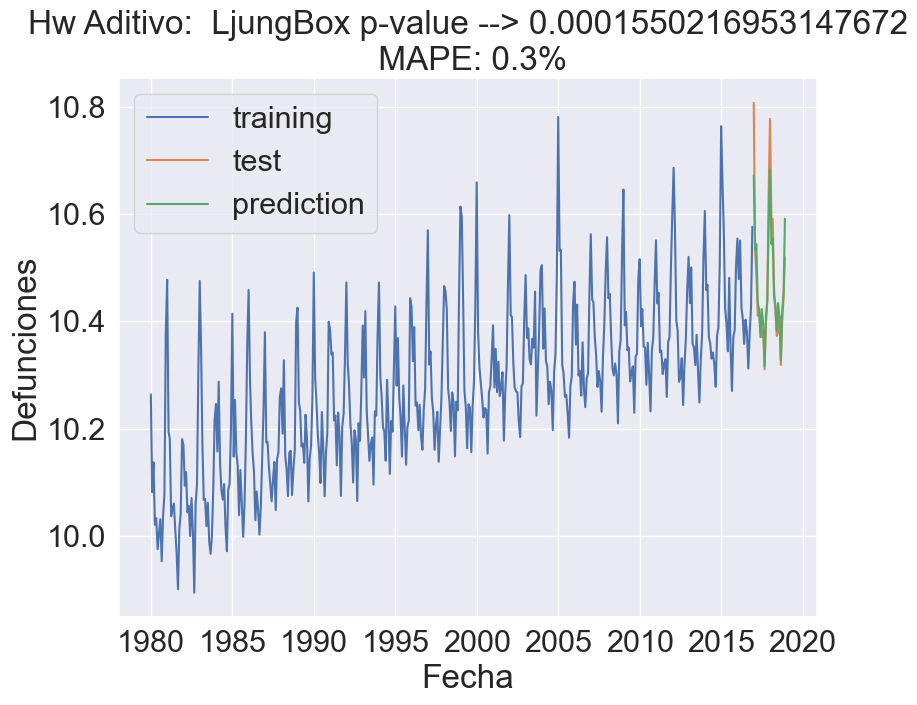

0.0001550216953147672


In [72]:
# Función para evaluar modelo
def eval_model(model,tr,tst,name='Model',lags=12):
    lb = np.mean(sm.stats.acorr_ljungbox(model.resid, lags=lags, return_df=True).lb_pvalue)
    pred = model.forecast(steps=len(tst))
    fig1, ax = plt.subplots()
    ax.plot(tr, label='training')
    ax.plot(tst, label='test')
    ax.plot(pred, label='prediction')
    plt.legend(loc='upper left')
    tit = name + ":  LjungBox p-value --> " + str(lb) + "\n MAPE: " + str(round(mean_absolute_percentage_error(tst, pred)*100,2)) + "%"
    plt.title(tit)
    plt.ylabel('Defunciones')
    plt.xlabel('Fecha')
    plt.show()
    print(lb)

hw_add = ets.ExponentialSmoothing(def_tr['Todas las causas'],trend='add', damped_trend=False, seasonal='add').fit()
hw_add.summary()
eval_model(hw_add,def_tr['Todas las causas'],def_tst['Todas las causas'],'Hw Aditivo')

**Suavizado de Holt-Winters multiplicativo**

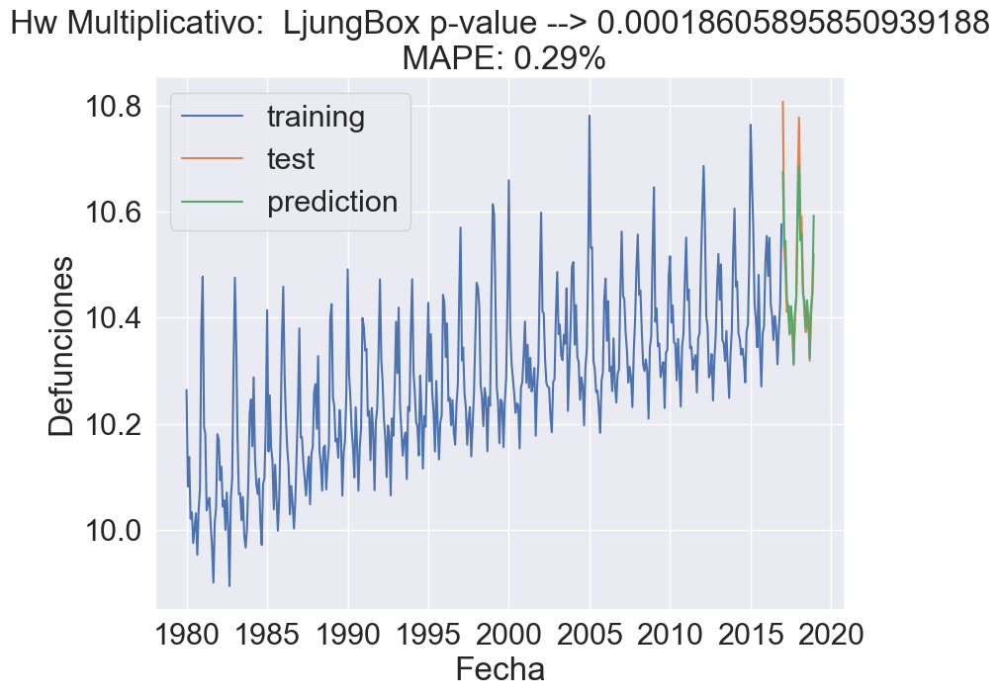

0.00018605895850939188


In [73]:
hw_mul = ets.ExponentialSmoothing(def_tr['Todas las causas'],trend='mul', damped_trend=False, seasonal='mul').fit()
hw_mul.summary()

eval_model(hw_mul,def_tr['Todas las causas'],def_tst['Todas las causas'],'Hw Multiplicativo')

**Autocorrelaciones con Intervalos de Confianza**

Correlogramas de los residuos:

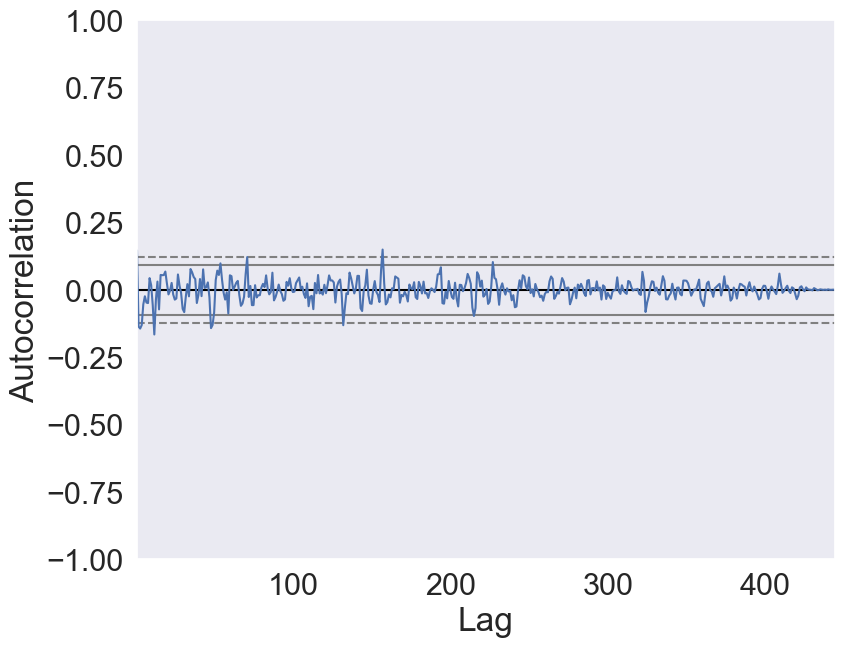

In [74]:
# autocorrelacion modelo multiplicativo
from pandas.plotting import autocorrelation_plot

plt.clf()
autocorrelation_plot(hw_mul.resid)
plt.show()

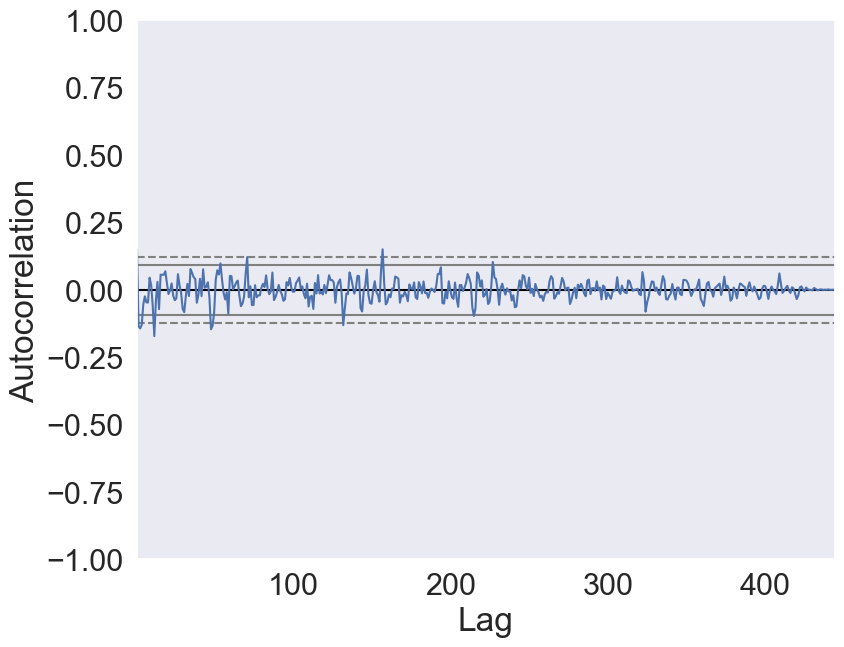

In [75]:
# autocorrelacion modelo aditivo
plt.clf()
autocorrelation_plot(hw_add.resid)
plt.show()

## Modelos ARIMA
### ARIMA manual

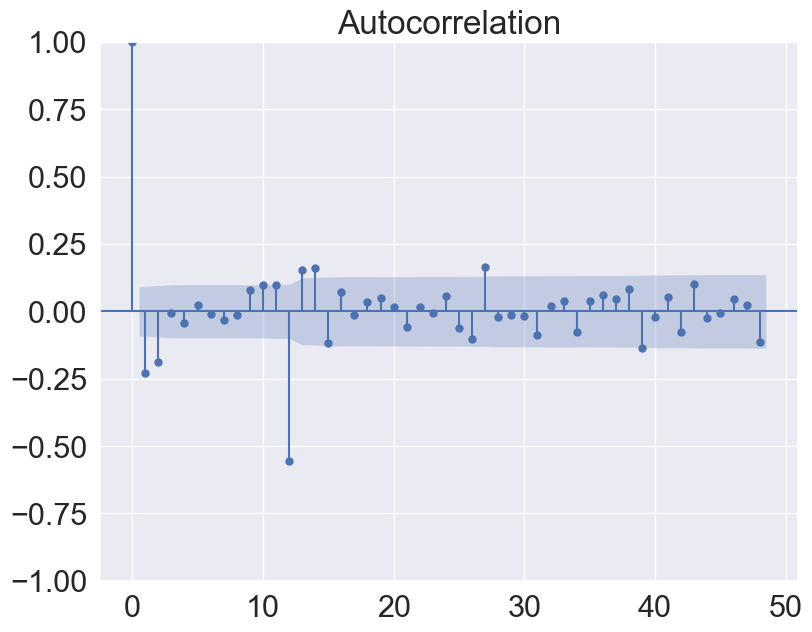

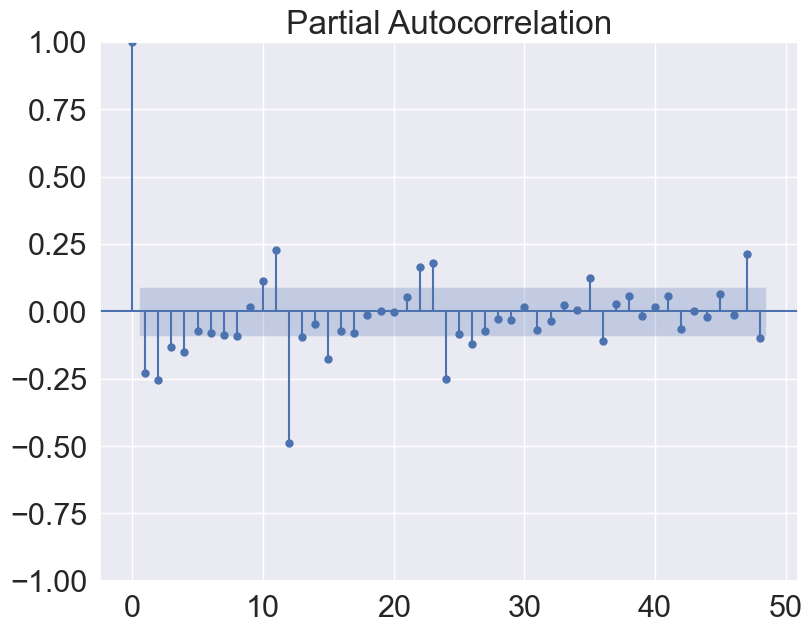

In [76]:
plot_acf(defLog_diff_1_12.dropna(inplace=False),lags=48)
plt.show()
plot_pacf(defLog_diff_1_12.dropna(inplace=False),lags=48,method='ywm')
plt.show()

In [77]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
  
arima1 = SARIMAX(def_tr['Todas las causas'], 
                order = (0, 1, 1), 
                seasonal_order =(0, 1, 1, 12))
  
arima_1 = arima1.fit()
arima_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   Todas las causas   No. Observations:                  444
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 12)   Log Likelihood                 682.469
Date:                            Fri, 24 Feb 2023   AIC                          -1358.938
Time:                                    12:36:13   BIC                          -1346.740
Sample:                                01-01-1980   HQIC                         -1354.122
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5498      0.038    -14.483      0.000      -0.624      -0.475
ma.S.L12      -0.9954      0.409     -2.435      0.015      -1.797      -0.194
sigma2         0.0022      0.001      2.529      0.011       0.001       0.004
===================================================================================
Ljung-Box (L1) (Q):                   9.67   Jarque-Bera (JB):               157.55
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.80   Skew:                             0.68
Prob(H) (two-sided):                  0.17   Kurtosis:                         5.63
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

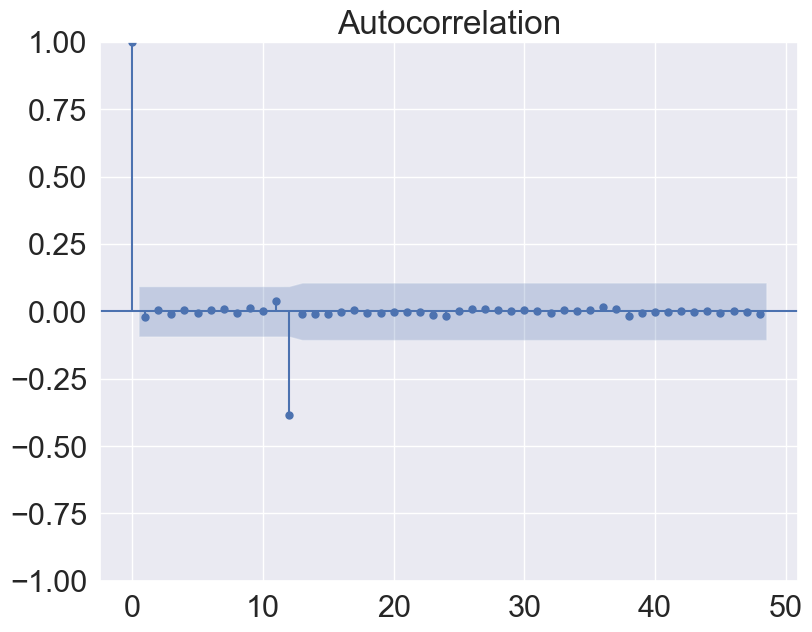

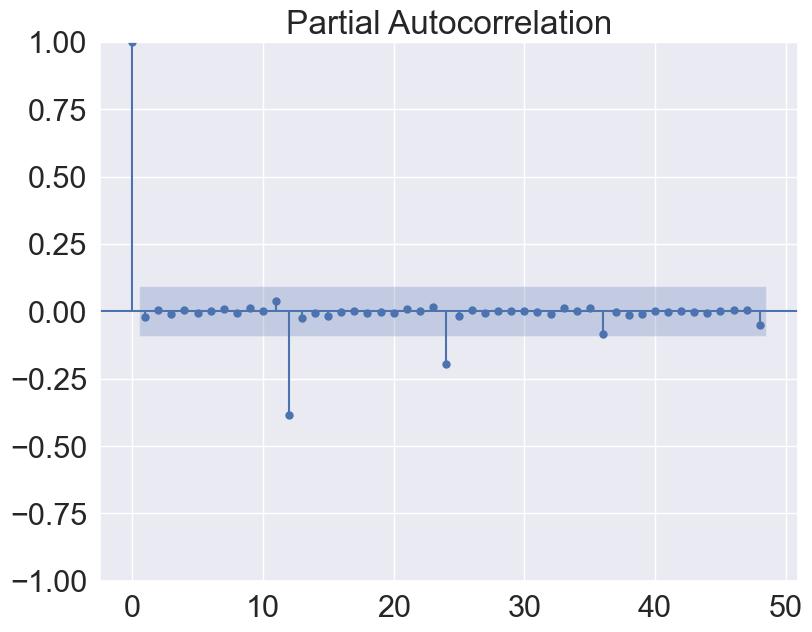

In [78]:
plot_acf(arima_1.resid,lags=48)
plt.show()
plot_pacf(arima_1.resid,lags=48,method='ywm')
plt.show()

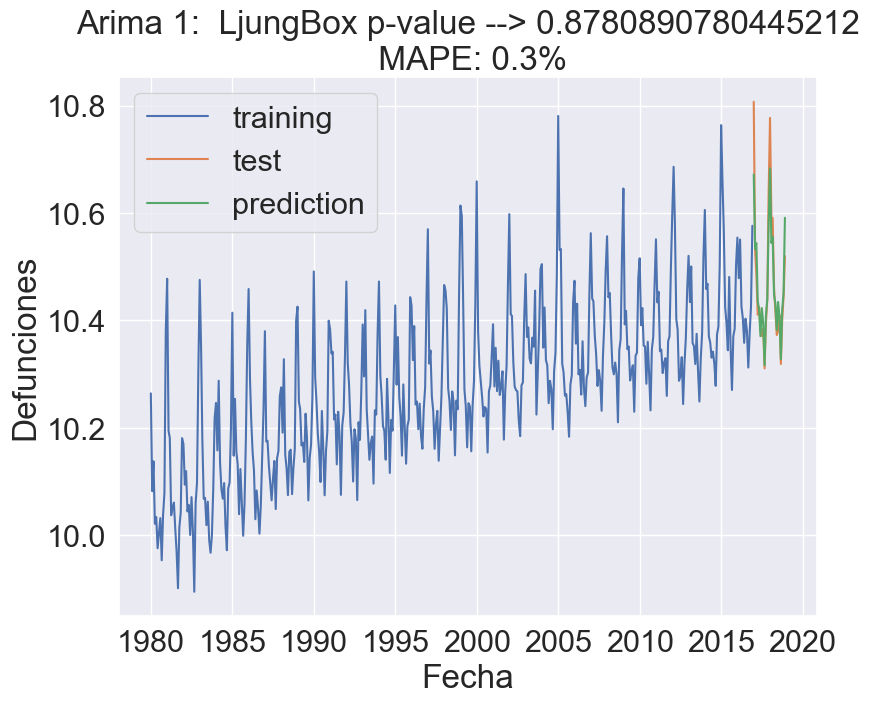

0.8780890780445212


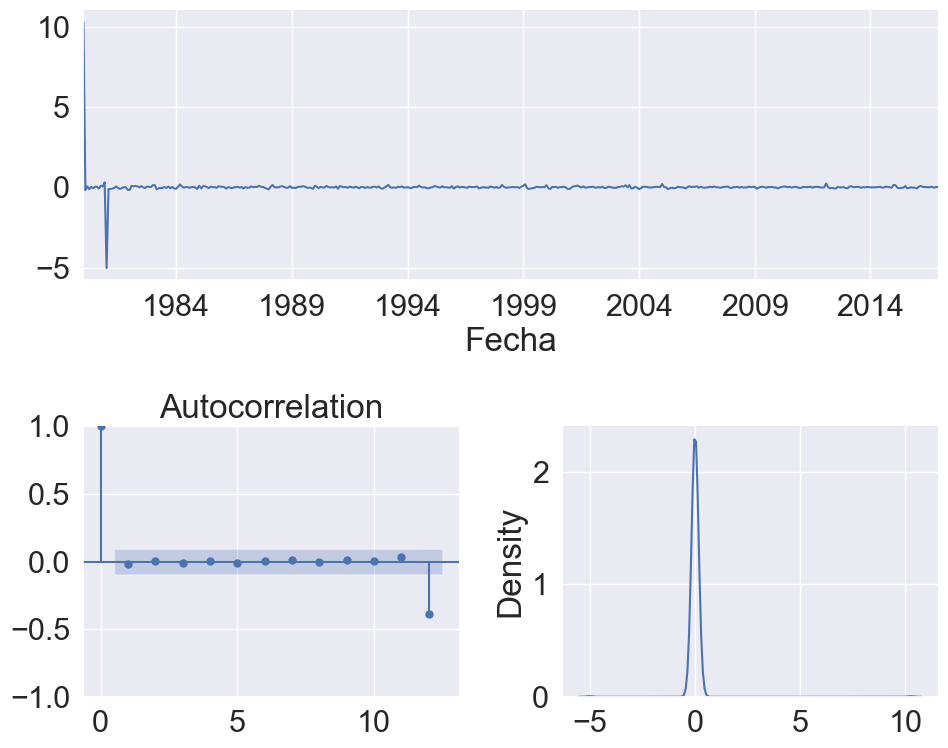

** Mean of the residuals:  0.01

** Ljung Box Test, p-value: 0.878 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot:xlabel='Fecha'>,
 <AxesSubplot:title={'center':'Autocorrelation'}>,
 <AxesSubplot:ylabel='Density'>)

In [79]:
eval_model(arima_1,def_tr['Todas las causas'],def_tst['Todas las causas'],'Arima 1')

nf.residcheck(arima_1.resid,12)

### ARIMA automático

In [80]:
import pmdarima as pm

# Ajustamos modelo arima step-wise con métrica AIC para la serie de vuelos
arima_auto = pm.auto_arima(def_tr['Todas las causas'], start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=5, max_q=5, # maximum p and q
                      m=12,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=True,   # No Seasonality
                      #start_P=None, 
                      D=None, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(arima_auto.summary())

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=-1235.897, Time=2.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-424.481, Time=0.25 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-1187.582, Time=2.63 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-904.066, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3331.164, Time=0.05 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=-1006.921, Time=2.21 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=-1185.545, Time=1.60 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=-1277.005, Time=10.78 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=-1281.791, Time=10.22 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=-800.463, Time=6.68 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=9.51 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=-1264.302, Time=13.97 sec
 ARIMA(1,0,2)(2,0,0)[12] intercept   : AIC=-1279.643, Time=10.63 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=-1029.249, Time=10.38 sec
 ARIMA(0,0

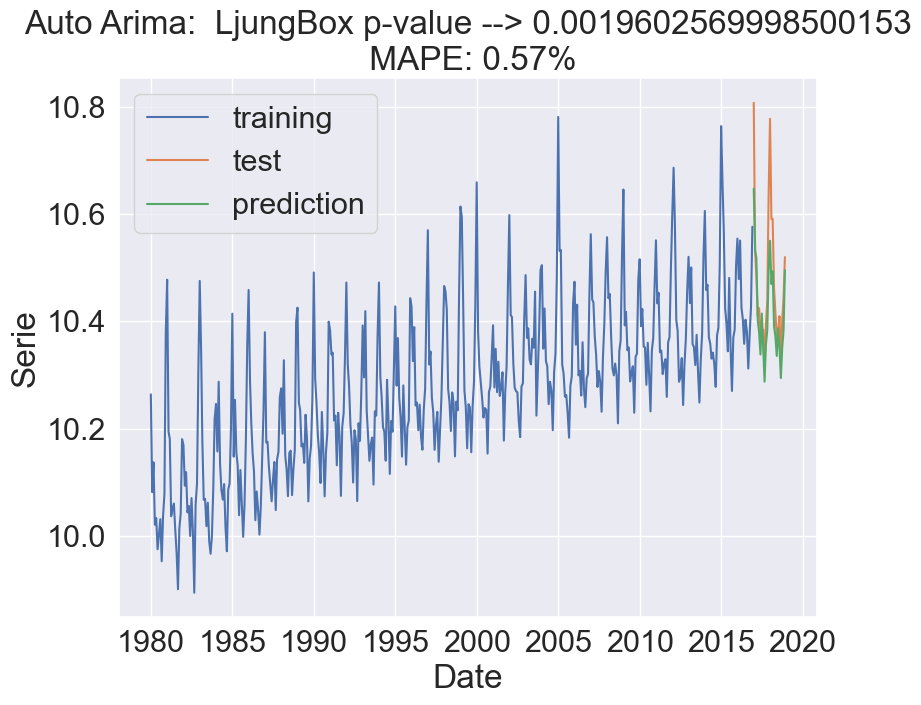

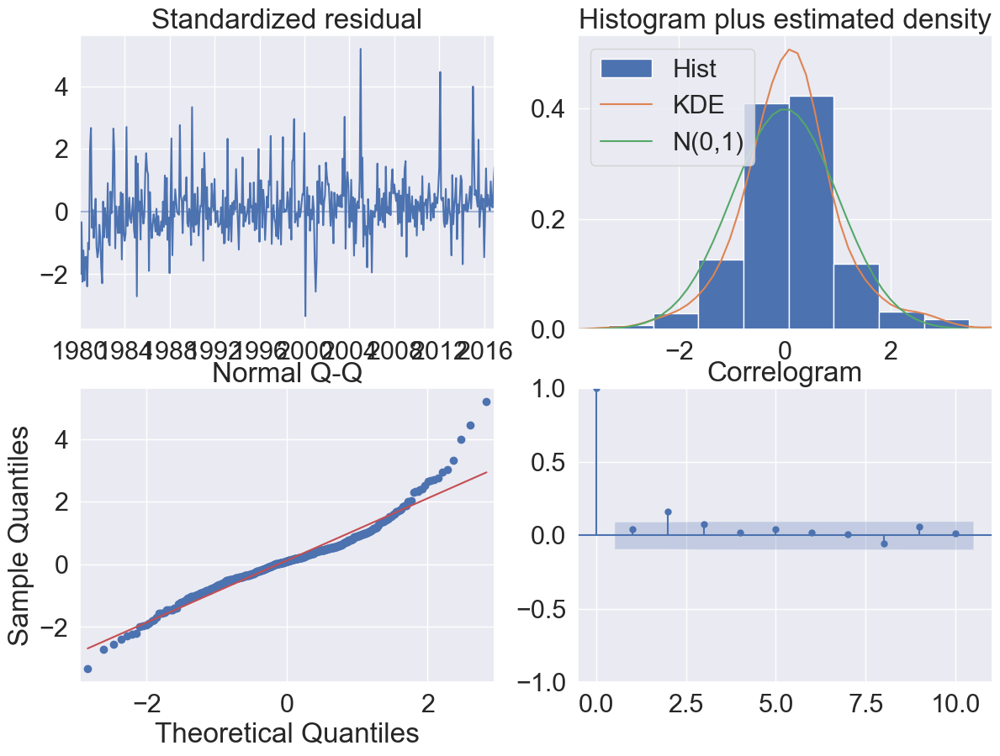

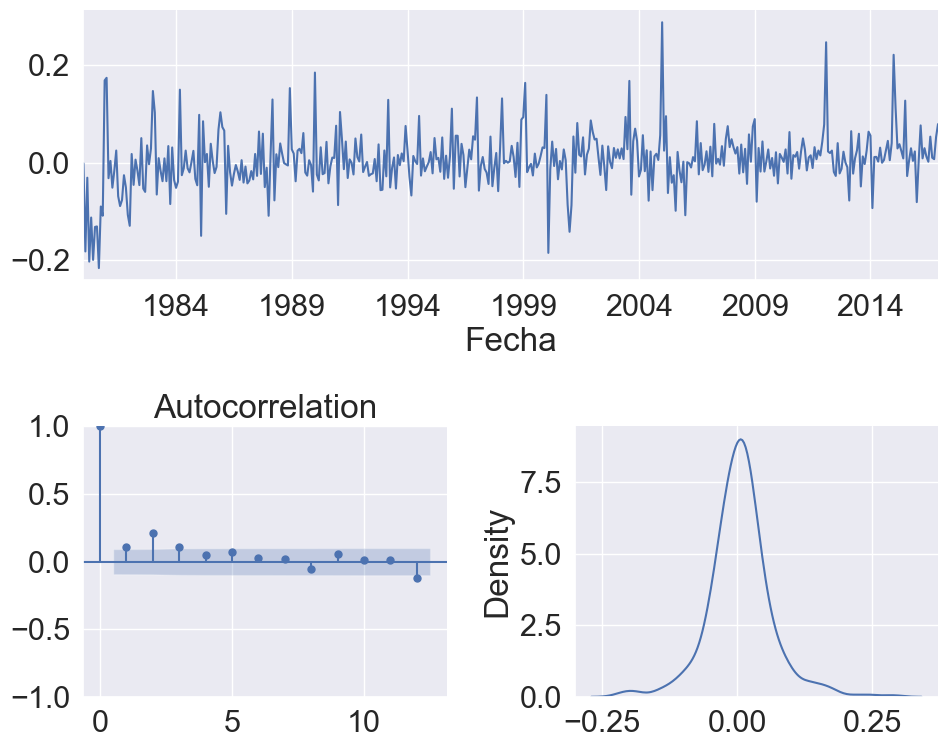

** Mean of the residuals:  0.01

** Ljung Box Test, p-value: 0.002 (<0.05, Correlated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.001 (<0.05, Stationary)


(<AxesSubplot:xlabel='Fecha'>,
 <AxesSubplot:title={'center':'Autocorrelation'}>,
 <AxesSubplot:ylabel='Density'>)

In [81]:
nf.eval_model_Aarima(arima_auto,def_tr['Todas las causas'],def_tst['Todas las causas'],'Auto Arima')
nf.residcheck(arima_auto.resid(),12)